In [1]:
import codecs
import arff
import pandas as pd
import pickle



file_ = codecs.open('eurlex_tokenstring.arff','r','utf8')
data = arff.load(file_)

print(data.keys())

df=pd.DataFrame(data.get('data'))
df.to_pickle('data.pk1')
ddf = pd.read_pickle('data.pk1')

print(ddf[0:10])

dict_keys(['description', 'relation', 'attributes', 'data'])
      0                                                  1
0  14.0  convent intern commiss rhine bern convent le g...
1  17.0  exchang letter commiss intern bureau weight me...
2  38.0  council decis juli conclus protocol access uni...
3  41.0  addit agreement agreement product clock watch ...
4  42.0  exchang letter india excel mr swaminathan amba...
5  43.0  exchang letter pakistan excel mr riaz piracha ...
6  45.0  addit protocol preambl majesti king belgian pr...
7  46.0  agreement product provinc european coal steel ...
8  52.0  agreement european econom commun swiss confede...
9  53.0  council direct decemb tax turnov tax affect co...


In [2]:
import pandas as pd 
import pickle


with open('id2class_eurlex_subject_matter.txt','r') as file:
    lines=file.readlines()

# labels contains each label and doc id pair from the qrels in a separate list
labels=[]
for line in lines:
    labels.append(line.split()[0:2])


# labelsset contains only unique labels
labellist=[]
for label in labels:
    labellist.append(label[0])

labelset=set(labellist)

labelcount=[]
for label in labelset:
    labelcount.append([label,labellist.count(label)])

with open("Labelcount.txt", "w") as text_file:
    for entry in labelcount:
        print(f"{entry[0]} {entry[1]}", file=text_file)

labelset_list=list(labelset)
pickle.dump(labelset_list,open('labellist.pkl','wb'))
pickle.dump(labels,open('label_doc.pkl','wb'))

print(labelset_list[0:10])
print(labels[0:10])

['food_aid', 'free_circulation', 'potatoes', 'harmonisation_of_customs_law_:_inward_processing', 'european_system_of_central_banks', 'principles', 'transport', 'safety_at_work_and_elsewhere', 'adjustment', 'balance_of_payments']
[['external_relations', '14'], ['environment', '14'], ['external_relations', '17'], ['cooperation', '17'], ['external_relations', '38'], ['commercial_policy', '38'], ['accession_to_agreement', '38'], ['gatt', '38'], ['external_relations', '41'], ['commercial_policy', '41']]


In [7]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer

ddf = pd.read_pickle('data.pkl')

listStrings = list(ddf[1])

vector = TfidfVectorizer(min_df=10)
matrix=vector.fit_transform(listStrings)
print(matrix[0])

  (0, 3562)	0.05709523215571317
  (0, 8152)	0.01978536179895133
  (0, 3251)	0.022170538995722196
  (0, 13643)	0.06851543650614274
  (0, 1665)	0.020198657417340168
  (0, 9058)	0.22110716266491645
  (0, 6882)	0.0618650975275436
  (0, 4016)	0.6625932003964377
  (0, 8890)	0.23426065403111532
  (0, 13938)	0.014599632714798853
  (0, 6513)	0.010335172079894879
  (0, 549)	0.010906311515283686
  (0, 6383)	0.010228150299362589
  (0, 4817)	0.10396653145237647
  (0, 6916)	0.012256084616401678
  (0, 4826)	0.008482842064200856
  (0, 9496)	0.007912570639378301
  (0, 13854)	0.008268596437975957
  (0, 11527)	0.0042676349567580315
  (0, 1345)	0.007039333244116642
  (0, 3422)	0.024779459032227634
  (0, 15473)	0.023598740693968667
  (0, 3267)	0.025059812699143345
  (0, 18270)	0.023477604495425353
  (0, 5620)	0.021432299455641436
  :	:
  (0, 258)	0.0009709538399745853
  (0, 11491)	0.001477290108675888
  (0, 1392)	0.0008172085726843932
  (0, 639)	0.0016742859508571486
  (0, 14545)	0.0007454618690035868
  (0

In [8]:
matrix

<19348x18615 sparse matrix of type '<class 'numpy.float64'>'
	with 4906553 stored elements in Compressed Sparse Row format>

In [11]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
import pickle
from sklearn.model_selection import train_test_split
from scipy.sparse import csr_matrix

#load imported data
label_doc=pickle.load(open('label_doc.pkl','rb'))
labellist=pickle.load(open('labellist.pkl','rb'))
print(label_doc[1])

#make a matrix of labels (document x labelvector)
used_ids=[]
i=-1
label_matrix=np.zeros((19348,201))
for entry in label_doc:
    if int(entry[1]) not in used_ids:
        used_ids.append(int(entry[1]))
        i+=1
        column=labellist.index(entry[0])
        label_matrix[i,column]=1
    else:
        column=labellist.index(entry[0])
        label_matrix[i,column]=1



#import text data
ddf = pd.read_pickle('data.pkl')
ddf.columns=['id','text']

#get ids from text data and delete the text data for the ones that are not in our labels
doc_ids=list(ddf['id'])
doc_ids=list(map(int,doc_ids))
no_labels=list(set(doc_ids)-set(used_ids))
ddf[~ddf.id.isin(no_labels)]
listStrings = list(ddf['text'])



x_train, x_test, y_train, y_test=train_test_split(listStrings,label_matrix,test_size=0.2)

vector = TfidfVectorizer(min_df=5)
matrix=vector.fit_transform(x_train)
x_test=vector.transform(x_test)
print(np.shape(matrix))

pickle.dump(matrix,open('tfidf.pkl','wb'))
pickle.dump(vector,open('vectorizer.pkl','wb'))
pickle.dump(y_train,open('y_train.pkl','wb'))
pickle.dump(y_test,open('y_test.pkl','wb'))
pickle.dump(x_test,open('x_test.pkl','wb'))
print(matrix)

['environment', '14']
(15478, 30696)
  (0, 539)	0.22242877805167627
  (0, 9020)	0.02225336130318851
  (0, 5411)	0.05564613492812401
  (0, 22206)	0.0298260490829931
  (0, 5315)	0.2578152137075951
  (0, 20680)	0.09575613443079325
  (0, 4759)	0.11326031867237657
  (0, 25378)	0.3346749368120685
  (0, 10224)	0.06474131786234567
  (0, 12693)	0.20976295170105103
  (0, 16044)	0.07162435350058785
  (0, 17671)	0.18921956607785917
  (0, 7701)	0.15205468526396818
  (0, 21169)	0.18921956607785917
  (0, 11956)	0.036507367127758046
  (0, 21892)	0.05511251415774675
  (0, 19450)	0.01158883841705244
  (0, 5736)	0.37435147153060366
  (0, 19453)	0.32726519515119307
  (0, 6935)	0.006635919900761484
  (0, 20793)	0.048482489981515685
  (0, 5343)	0.025631180761925425
  (0, 5760)	0.11870682547148705
  (0, 25547)	0.05420538355089279
  (0, 21260)	0.059380132024563194
  :	:
  (15477, 18562)	0.06130411592416638
  (15477, 28484)	0.041960384988396195
  (15477, 24987)	0.046104516731748695
  (15477, 27983)	0.061271873

In [81]:
type(label_matrix)
magicmatrix=pd.DataFrame(label_matrix)
magicmatrix

,0,1,2,3,4,5,6,7,8,9,...,191,192,193,194,195,196,197,198,199,200
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


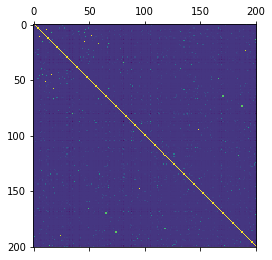

In [85]:
import matplotlib.pyplot as plt

plt.matshow(magicmatrix.corr())
corr=magicmatrix.corr()
corr.style.background_gradient(cmap='coolwarm')

In [88]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score
from keras.metrics import binary_accuracy
from sklearn.multiclass import OneVsRestClassifier
import pickle

#getting labellist
labellist=pickle.load(open('labellist.pkl','rb'))
#getting training and testdata
#shape x_train/x_test: rows represent documents, columns represent words from all documents, cells represent tfidf score
#shape y_train/y_test: rows represent documents, columns represent labels, cells indicitade whether or not a label is assigned to a document
x_train=pickle.load(open('tfidf.pkl','rb'))
y_train=pd.DataFrame(pickle.load(open('y_train.pkl','rb')))
x_test=pickle.load(open('x_test.pkl','rb'))
y_test=pd.DataFrame(pickle.load(open('y_test.pkl','rb')))


print(x_train)
print(y_train)

print(np.shape(x_train))
print(np.shape(y_train))
print(np.shape(x_test))
print(np.shape(y_test))


#define OnevsRestClassifier with Multinomial Naive Bayes Estimator
orbc = OneVsRestClassifier(MultinomialNB(fit_prior=True, class_prior=None))

predictionMatrix=[]
#train one classifier for each label
for label in range(200):
    
    #train the model on training data
    orbc.fit(x_train, y_train[label])
    #calculate testing accuracy using accuracy_score function
    prediction=orbc.predict(x_test)
    print(prediction)
    #print accuracy for each label
    predictionMatrix.append([y_test[label],prediction,binary_accuracy(y_test[label], prediction)])
    


ModuleNotFoundError: No module named 'keras'

In [87]:
juhu=pd.DataFrame({'labelfreq':label_matrix.sum(axis=0),'labels':labellist})
juhu

#juhu.sort_values(by='labelfreq',ascending=False)

,labelfreq,labels
0,96.0,food_aid
1,8.0,free_circulation
2,15.0,potatoes
3,1.0,harmonisation_of_customs_law_:_inward_processing
4,25.0,european_system_of_central_banks
5,100.0,principles
6,959.0,transport
7,257.0,safety_at_work_and_elsewhere
8,3.0,adjustment
9,27.0,balance_of_payments


6
0
0
0
1
6
8
6
0
4
6
0
6
6
9
0
0
6
6
6
0
4
8
5
6
6
6
0
6
0
6
6
19
6
0
225
6
6
0
0
6
7
6
6
4
0
0
6
6
6
2
0
0
0
6
0
6
0
6
0
0
2
6
0
0
6
6
6
9
6
0
0
6
6
0
5
0
6
6
8
6
385
5
0
0
6
0
6
49
3
6
6
6
0
0
6
6
7
6
6
4
0
6
0
0
13
0
6
0
0
0
6
6
6
6
7
0
4
5
6
0
0
0
6
6
6
6
6
5
0
6
2
6
0
0
6
6
6
7
6
6
7
6
6
4
6
6
6
6
6
0
6
0
0
6
0
4
6
0
6
6
0
6
0
0
6
6
6
0
24
6
6
0
0
6
0
6
0
0
0
0
6
6
6
0
6
6
0
0
6
6
0
0
3
7
7
0
6
6
9
Wir haben69Label, die nie vorhergesagt werden. Das sind 0.34328358208955223% aller Labels
0
385


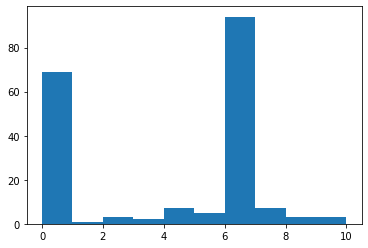

In [57]:
zero=0
matrixx=[]
for label in range(200):
    matrixx.append(len(np.nonzero(predictionMatrix[label][1])[0]))
    print(len(np.nonzero(predictionMatrix[label][1])[0]))
    if len(np.nonzero(predictionMatrix[label][1])[0])==0:
        zero+=1
print('Wir haben'+str(zero)+'Label, die nie vorhergesagt werden. Das sind ' + str(zero/201) + '% aller Labels')
plt.hist(matrixx, bins=[0,1,2,3,4,5,6,7,8,9,10])
print(min(matrixx))
print(max(matrixx))

In [30]:
print(predictionMatrix[0][1])

[0. 0. 0. ... 0. 0. 0.]


In [ ]:
[p[]predictionMatrix]

In [ ]:
***EXPLORING***
%matplotlib inline
import re
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
import seaborn as sns
df = pd.read_csv("train 2.csv", encoding = "ISO-8859-1")
df.head()